In [1]:
import pandas as pd
import numpy as np
import geopandas as gpd
import glob
import matplotlib.pyplot as plt
import seaborn as sns

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


# All properties

In [ ]:
LOSS = pd.read_csv('./../../Volumes/Extreme_SSD/WORK/EPC/scottish_EPC/DZ_loss.csv').drop(columns=['Unnamed: 0','count_count'])
HEAT = pd.read_csv('./../../Volumes/Extreme_SSD/WORK/EPC/scottish_EPC/DZ_heat.csv').drop(columns=['Unnamed: 0','count_count'])
HOUSE = pd.read_csv('./../../Volumes/Extreme_SSD/WORK/EPC/scottish_EPsC/DZ_house.csv').drop(columns=['Unnamed: 0'])
ENER = pd.read_csv('./../../Volumes/Extreme_SSD/WORK/EPC/scottish_EPC/DZ_energy.csv').drop(columns=['Unnamed: 0','count_count'])
OTHER = pd.read_csv('./../../Volumes/Extreme_SSD/WORK/EPC/scottish_EPC/DZ_other.csv').drop(columns=['Unnamed: 0','count_count'])
census = pd.read_csv('./../../Volumes/Extreme_SSD/WORK/EPC/Jamie -All households - GB.csv'
                     ).rename(columns={'LSOA2021_code':'LSOA21CD', 'lsoa21_dz11_code':'DataZone'})

In [22]:
HOUSE = HOUSE.rename(columns={'count_count':'count_epc'})

data = LOSS.merge(HEAT, on = 'DataZone'
           ).merge(HOUSE, on = 'DataZone'
                   ).merge(ENER, on = 'DataZone'
                           ).merge(OTHER, on = 'DataZone'
                                   ).merge(census.loc[:,['DataZone','Total: All households']], on = 'DataZone', how = 'left' )

data['PROP_EPC_FROM_CENSUS_HOUSE'] = data['count_epc']/data['Total: All households']

In [21]:
DZ = gpd.read_file('./../../Volumes/Extreme_SSD/WORK/boundaries/scotland/DataZones_2011.geojson')
DZ = DZ.loc[:,['DataZone', 'Name','geometry']]
DZ.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 6976 entries, 0 to 6975
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   DataZone  6976 non-null   object  
 1   Name      6976 non-null   object  
 2   geometry  6976 non-null   geometry
dtypes: geometry(1), object(2)
memory usage: 163.6+ KB


In [23]:
data = DZ.merge(data, on = 'DataZone', how = 'left')

In [26]:
data.to_file('./../../Volumes/Extreme_SSD/WORK/EPC/scottish_EPC/DZ_data_raw.geojson')

/opt/anaconda3/envs/epc/lib/python3.10/site-packages/pyogrio/raw.py:723: RuntimeWarning: NaN of Infinity value found. Skipped
  ogr_write(


In [27]:
for_rates = ['Roof_insulati_sum', 'Roof_thatch_sum', 'NUMBER_OPEN_FIREPLACES_sum',
       'NUMBER_OPEN_FIREPLACES_binary_sum', 'MAIN_electric_sum',
       'MAIN_solid_fuel_sum', 'MAIN_other_sum', 'MAIN_electric_other_sum',
       'MAIN_electric_solid_sum', 'MAIN_solid_other_sum',
       'SECOND_electric_sum', 'SECOND_solid_fuel_sum', 'SECOND_other_sum',
       'SECOND_electric_other_sum', 'SECOND_electric_solid_sum',
       'SECOND_solid_other_sum', 'MAINS_GAS_FLAG_sum', 
       'Owner-occupied_sum', 'Rented (private)_sum', 'Rented (social)_sum',
       'Detached_sum', 'End-Terrace_sum', 'Mid-Terrace_sum',
       'Semi-Detached_sum', 'Bungalow_sum', 'Flat_sum', 'House_sum',
       'Maisonette_sum', 'Park_home_sum','1976-2002_sum', '1930-1949_sum',
       'before_1929_sum', '1950-1975_sum', '2003_onwards_sum','TOP_FLOOR_FLAT_sum',
       'TRANS_TYPE_other_sum', 'TRANS_TYPE_govdeal_sum','PHOTO_SUPPLY_bi_sum']

for i in for_rates:
    data[i] = data[i]/data['count_epc']


In [28]:
data.to_file('./../../Volumes/Extreme_SSD/WORK/EPC/scottish_EPC/DZ_data_rates.geojson')

## Outputs

In [31]:
cols_plot = ['MULTI_GLAZE_PROPORTION_median', 'MULTI_GLAZE_PROPORTION_mean',
       'EXTENSION_COUNT_median', 'EXTENSION_COUNT_mean', 'Roof_insulati_sum', 'Roof_thatch_sum',
       'NUMBER_OPEN_FIREPLACES_sum', 'NUMBER_OPEN_FIREPLACES_median',
       'NUMBER_OPEN_FIREPLACES_mean', 'NUMBER_OPEN_FIREPLACES_binary_sum',
       'MAIN_electric_sum', 'MAIN_solid_fuel_sum', 'MAIN_other_sum',
       'MAIN_electric_other_sum', 'MAIN_electric_solid_sum',
       'MAIN_solid_other_sum', 'SECOND_electric_sum', 'SECOND_solid_fuel_sum',
       'SECOND_other_sum', 'SECOND_electric_other_sum',
       'SECOND_electric_solid_sum', 'SECOND_solid_other_sum',
       'TOTAL_FLOOR_AREA_median', 'TOTAL_FLOOR_AREA_mean',
       'MAINS_GAS_FLAG_sum', 'Owner-occupied_sum',
       'Rented (private)_sum', 'Rented (social)_sum', 'Detached_sum',
       'End-Terrace_sum', 'Mid-Terrace_sum', 'Semi-Detached_sum',
       'Bungalow_sum', 'Flat_sum', 'House_sum', 'Maisonette_sum',
       'Park_home_sum','TOP_FLOOR_FLAT_sum', '1976-2002_sum', '1930-1949_sum',
       'before_1929_sum', '1950-1975_sum', '2003_onwards_sum', 'CURRENT_ENERGY_EFFICIENCY_median',
       'CURRENT_ENERGY_EFFICIENCY_mean',
       'CURRENT_ENERGY_RATING_numbered_median',
       'CURRENT_ENERGY_RATING_numbered_mean',
       'ENERGY_CONSUMPTION_CURRENT_median', 'ENERGY_CONSUMPTION_CURRENT_mean',
       'ENERGY_CONSUMPTION_POTENTIAL_median',
       'ENERGY_CONSUMPTION_POTENTIAL_mean',
       'TRANS_TYPE_other_sum', 'TRANS_TYPE_govdeal_sum','PROP_EPC_FROM_CENSUS_HOUSE','PHOTO_SUPPLY_bi_sum']

/opt/anaconda3/envs/epc/lib/python3.10/site-packages/mapclassify/classifiers.py:255: UserWarning: Not enough unique values in array to form 5 classes. Setting k to 1.
  warnings.warn(
/opt/anaconda3/envs/epc/lib/python3.10/site-packages/mapclassify/classifiers.py:255: UserWarning: Not enough unique values in array to form 5 classes. Setting k to 2.
  warnings.warn(
/opt/anaconda3/envs/epc/lib/python3.10/site-packages/mapclassify/classifiers.py:255: UserWarning: Not enough unique values in array to form 5 classes. Setting k to 2.
  warnings.warn(
/opt/anaconda3/envs/epc/lib/python3.10/site-packages/mapclassify/classifiers.py:255: UserWarning: Not enough unique values in array to form 5 classes. Setting k to 2.
  warnings.warn(
/opt/anaconda3/envs/epc/lib/python3.10/site-packages/mapclassify/classifiers.py:255: UserWarning: Not enough unique values in array to form 5 classes. Setting k to 4.
  warnings.warn(
/opt/anaconda3/envs/epc/lib/python3.10/site-packages/mapclassify/classifiers.py:

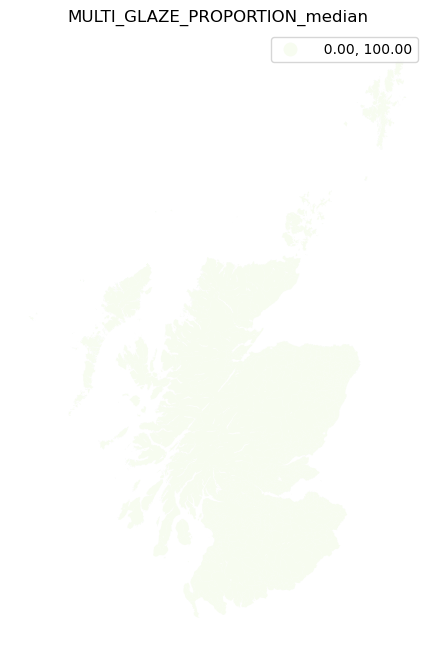

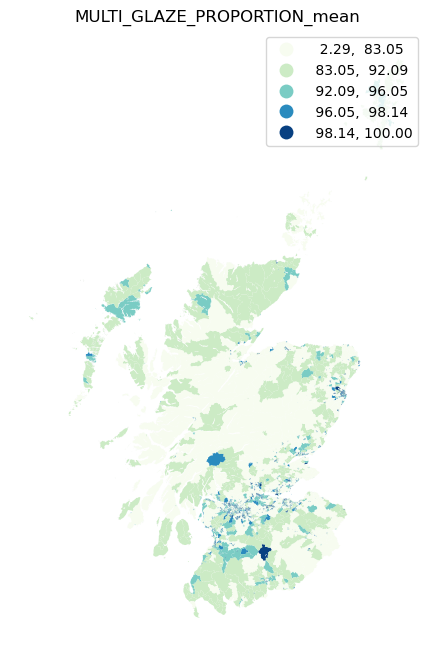

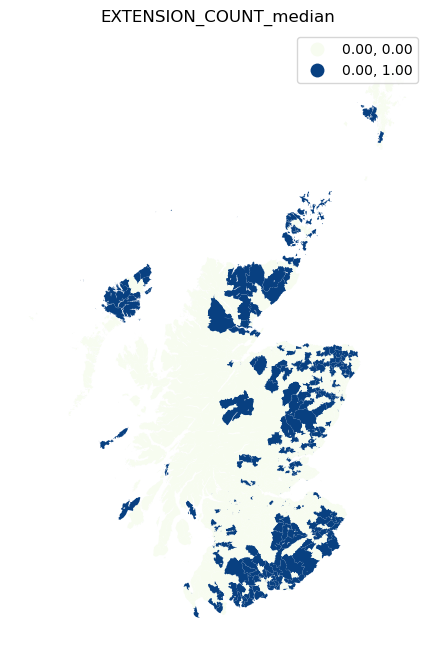

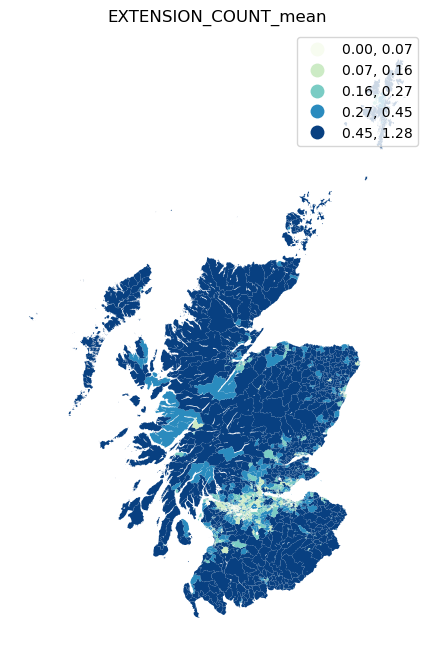

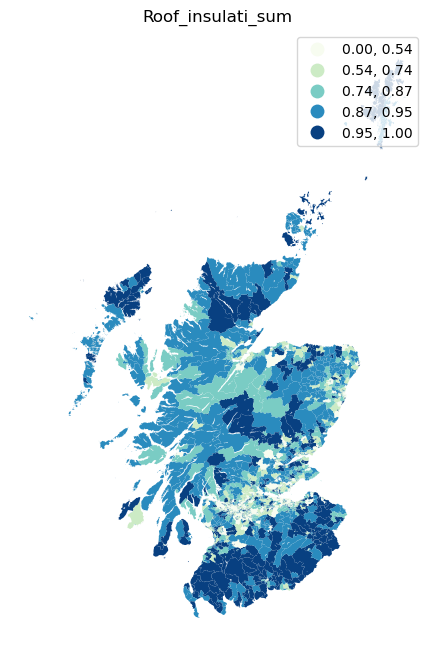

...

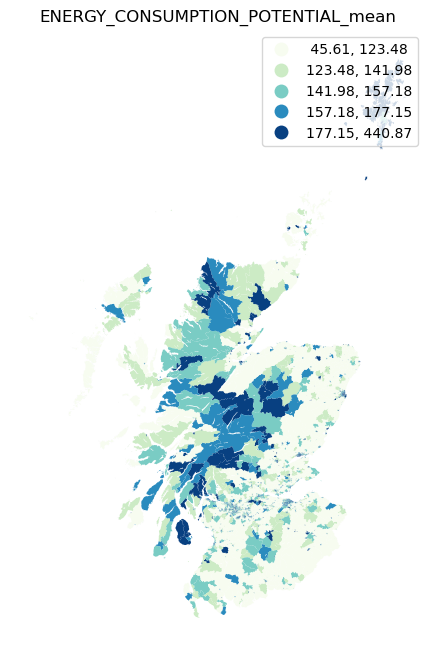

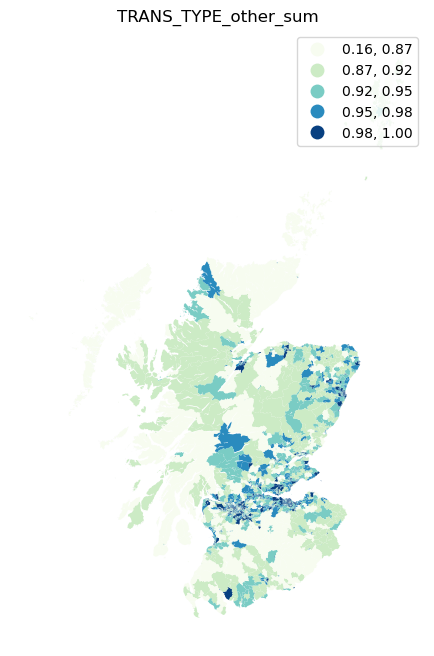

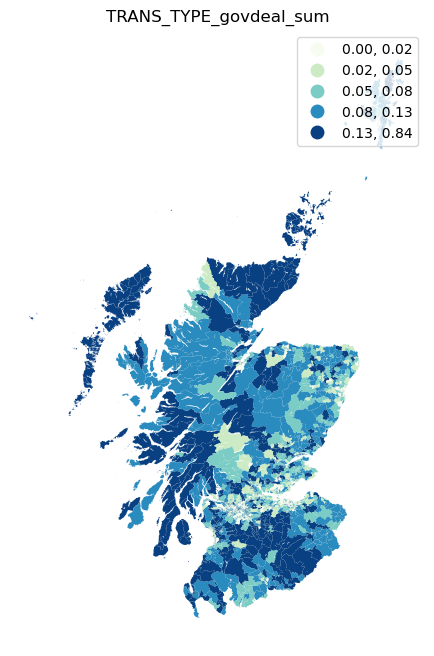

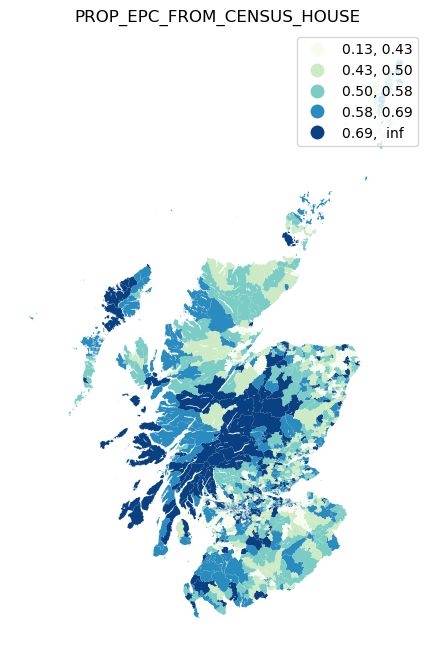

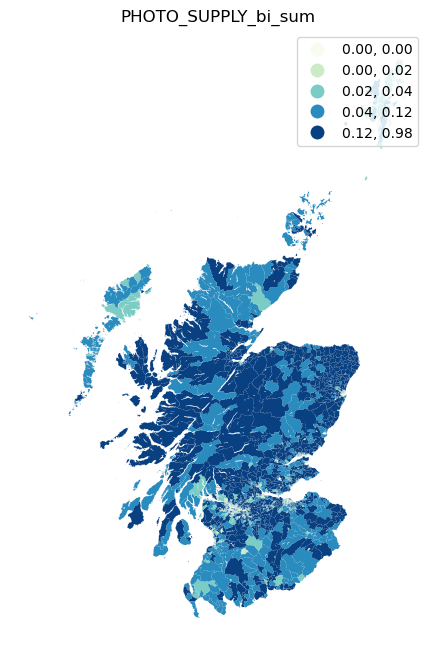

In [32]:
for i in cols_plot:
    ax = data.plot(column = i, legend = True, 
                                            cmap='GnBu',
                                            scheme="quantiles", k=5,
                                            figsize=(6, 8))
    ax.set_axis_off()
    plt.title(i)
    plt.savefig(str('./../../Volumes/Extreme_SSD/WORK/EPC/scottish_EPC/scottish_figures/all_prop/' + i +'.png'))

In [33]:
df = data.loc[:,cols_plot]
corr = df.corr()
corr.style.background_gradient(cmap='coolwarm', axis=None).to_excel('./../../Volumes/Extreme_SSD/WORK/EPC/scottish_EPC/scottish_figures/all_prop_corrs.xlsx')

# GAS only

In [34]:
LOSS = pd.read_csv('./../../Volumes/Extreme_SSD/WORK/EPC/scottish_EPC/DZ_GAS_loss.csv').drop(columns=['Unnamed: 0','count_count'])
HEAT = pd.read_csv('./../../Volumes/Extreme_SSD/WORK/EPC/scottish_EPC/DZ_GAS_heat.csv').drop(columns=['Unnamed: 0','count_count'])
HOUSE = pd.read_csv('./../../Volumes/Extreme_SSD/WORK/EPC/scottish_EPC/DZ_GAS_house.csv').drop(columns=['Unnamed: 0'])
ENER = pd.read_csv('./../../Volumes/Extreme_SSD/WORK/EPC/scottish_EPC/DZ_GAS_energy.csv').drop(columns=['Unnamed: 0','count_count'])
OTHER = pd.read_csv('./../../Volumes/Extreme_SSD/WORK/EPC/scottish_EPC/DZ_GAS_other.csv').drop(columns=['Unnamed: 0','count_count'])
census = pd.read_csv('./../../Volumes/Extreme_SSD/WORK/EPC/Jamie -All households - GB.csv'
                     ).rename(columns={'LSOA2021_code':'LSOA21CD', 'lsoa21_dz11_code':'DataZone'})

In [37]:
print(len(HOUSE['DataZone']))
print(len(OTHER['DataZone']))
print(len(LOSS['DataZone']))
print(len(HEAT['DataZone']))
print(len(ENER['DataZone']))
print(len(census['DataZone']))


6204
6204
6204
6204
6204
42648


In [38]:
HOUSE = HOUSE.rename(columns={'count_count':'count_epc'})
data = LOSS.merge(HEAT, on = 'DataZone'
           ).merge(HOUSE, on = 'DataZone'
                   ).merge(ENER, on = 'DataZone'
                           ).merge(OTHER, on = 'DataZone'
                                   ).merge(census.loc[:,['DataZone','Total: All households']], on = 'DataZone',how = 'left' )
data['PROP_EPC_FROM_CENSUS_HOUSE'] = data['count_epc']/data['Total: All households']

In [39]:
data = DZ.merge(data, on = 'DataZone')
data = data[data['count_epc'] >= 5]

In [40]:
data.to_file('./../../Volumes/Extreme_SSD/WORK/EPC/scottish_EPC/GAS_DZ_data_raw.geojson')

In [43]:
for_rates = ['Roof_insulati_sum', 'Roof_thatch_sum', 'NUMBER_OPEN_FIREPLACES_sum',
       'NUMBER_OPEN_FIREPLACES_binary_sum', 'MAIN_electric_sum',
       'MAIN_solid_fuel_sum', 'MAIN_other_sum', 'MAIN_electric_other_sum',
       'MAIN_electric_solid_sum', 'MAIN_solid_other_sum',
       'SECOND_electric_sum', 'SECOND_solid_fuel_sum', 'SECOND_other_sum',
       'SECOND_electric_other_sum', 'SECOND_electric_solid_sum',
       'SECOND_solid_other_sum', 'MAINS_GAS_FLAG_sum', 
       'Owner-occupied_sum', 'Rented (private)_sum', 'Rented (social)_sum',
       'Detached_sum', 'End-Terrace_sum', 'Mid-Terrace_sum',
       'Semi-Detached_sum', 'Bungalow_sum', 'Flat_sum', 'House_sum',
       'Maisonette_sum', '1976-2002_sum', '1930-1949_sum',
       'before_1929_sum', '1950-1975_sum', '2003_onwards_sum','TOP_FLOOR_FLAT_sum',
       'TRANS_TYPE_other_sum', 'TRANS_TYPE_govdeal_sum','PHOTO_SUPPLY_bi_sum']

for i in for_rates:
    data[i] = data[i]/data['count_epc']

In [44]:
data.to_file('./../../Volumes/Extreme_SSD/WORK/EPC/scottish_EPC/GAS_DZ_data_rates.geojson')

## Outputs

In [47]:
cols_plot = ['MULTI_GLAZE_PROPORTION_median', 'MULTI_GLAZE_PROPORTION_mean',
       'EXTENSION_COUNT_median', 'EXTENSION_COUNT_mean',  'Roof_insulati_sum', 'Roof_thatch_sum',
       'NUMBER_OPEN_FIREPLACES_sum', 'NUMBER_OPEN_FIREPLACES_median',
       'NUMBER_OPEN_FIREPLACES_mean', 'NUMBER_OPEN_FIREPLACES_binary_sum',
       'MAIN_electric_sum', 'MAIN_solid_fuel_sum', 'MAIN_other_sum',
       'MAIN_electric_other_sum', 'MAIN_electric_solid_sum',
       'MAIN_solid_other_sum', 'SECOND_electric_sum', 'SECOND_solid_fuel_sum',
       'SECOND_other_sum', 'SECOND_electric_other_sum',
       'SECOND_electric_solid_sum', 'SECOND_solid_other_sum',
       'TOTAL_FLOOR_AREA_median', 'TOTAL_FLOOR_AREA_mean',
       'MAINS_GAS_FLAG_sum', 'Owner-occupied_sum',
       'Rented (private)_sum', 'Rented (social)_sum', 'Detached_sum',
       'End-Terrace_sum', 'Mid-Terrace_sum', 'Semi-Detached_sum',
       'Bungalow_sum', 'Flat_sum', 'House_sum', 'Maisonette_sum',
       'TOP_FLOOR_FLAT_sum', '1976-2002_sum', '1930-1949_sum',
        '1950-1975_sum', '2003_onwards_sum', 'CURRENT_ENERGY_EFFICIENCY_median',
       'CURRENT_ENERGY_EFFICIENCY_mean',
       'CURRENT_ENERGY_RATING_numbered_median',
       'CURRENT_ENERGY_RATING_numbered_mean',
       'ENERGY_CONSUMPTION_CURRENT_median', 'ENERGY_CONSUMPTION_CURRENT_mean',
       'ENERGY_CONSUMPTION_POTENTIAL_median',
       'ENERGY_CONSUMPTION_POTENTIAL_mean',
       'TRANS_TYPE_other_sum', 'TRANS_TYPE_govdeal_sum','PROP_EPC_FROM_CENSUS_HOUSE','PHOTO_SUPPLY_bi_sum']

/opt/anaconda3/envs/epc/lib/python3.10/site-packages/mapclassify/classifiers.py:255: UserWarning: Not enough unique values in array to form 5 classes. Setting k to 1.
  warnings.warn(
/opt/anaconda3/envs/epc/lib/python3.10/site-packages/mapclassify/classifiers.py:255: UserWarning: Not enough unique values in array to form 5 classes. Setting k to 2.
  warnings.warn(
/opt/anaconda3/envs/epc/lib/python3.10/site-packages/mapclassify/classifiers.py:255: UserWarning: Not enough unique values in array to form 5 classes. Setting k to 2.
  warnings.warn(
/opt/anaconda3/envs/epc/lib/python3.10/site-packages/mapclassify/classifiers.py:255: UserWarning: Not enough unique values in array to form 5 classes. Setting k to 2.
  warnings.warn(
/opt/anaconda3/envs/epc/lib/python3.10/site-packages/mapclassify/classifiers.py:255: UserWarning: Not enough unique values in array to form 5 classes. Setting k to 4.
  warnings.warn(
/opt/anaconda3/envs/epc/lib/python3.10/site-packages/mapclassify/classifiers.py:

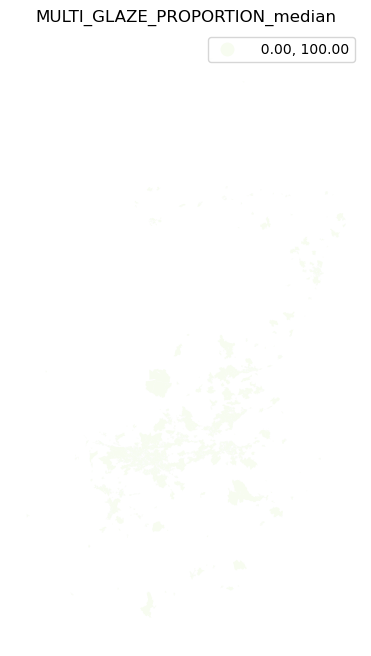

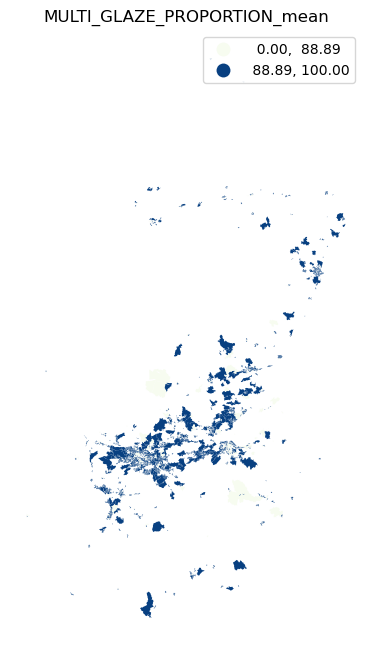

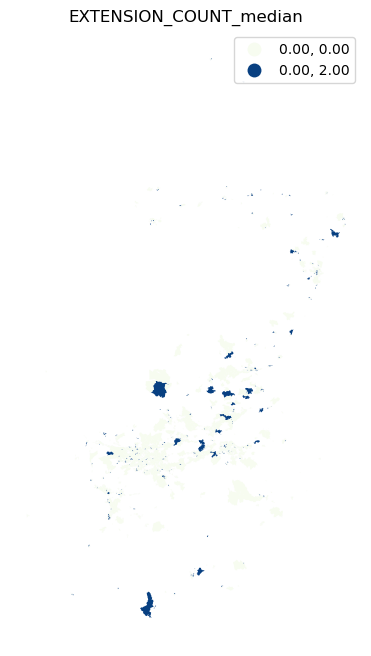

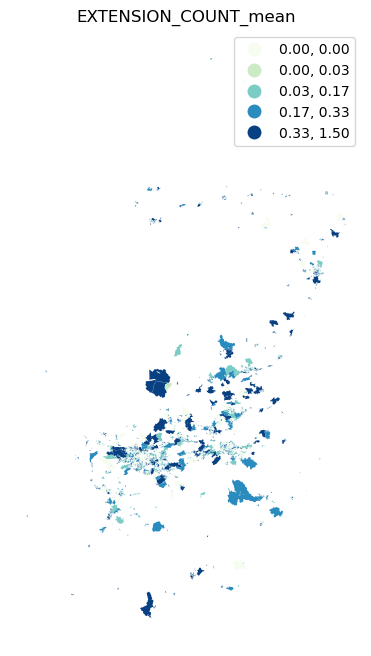

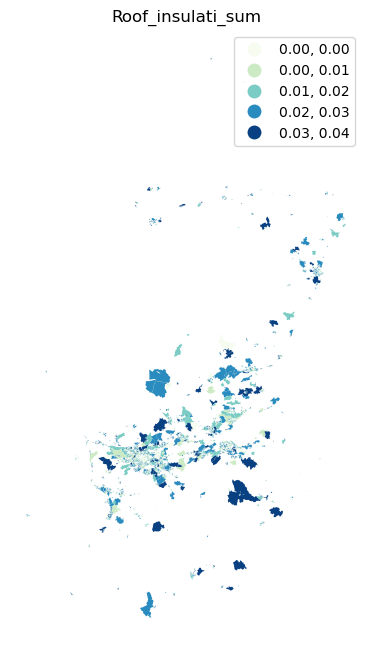

...

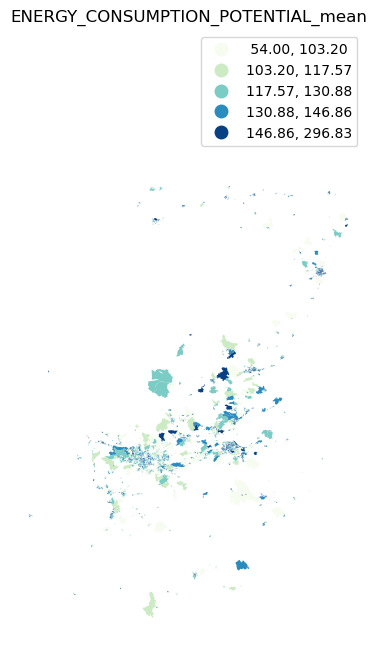

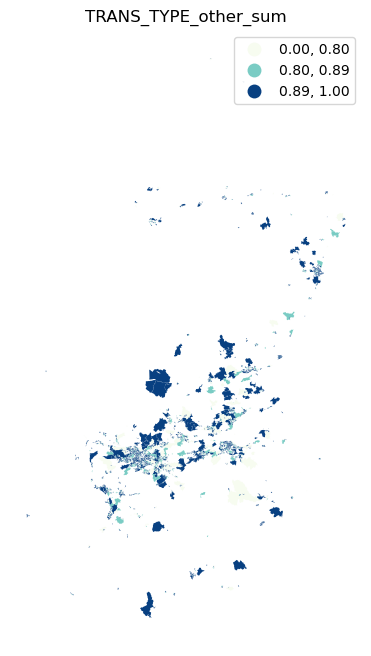

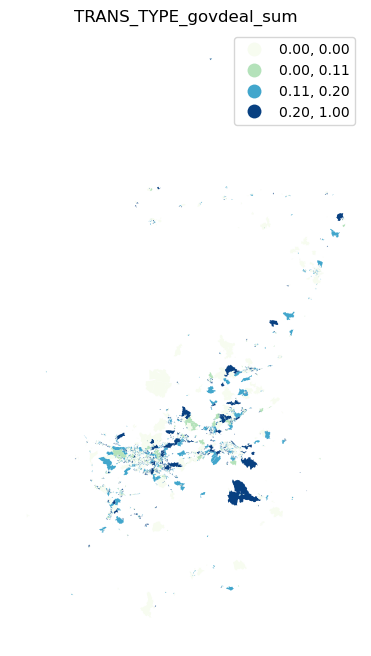

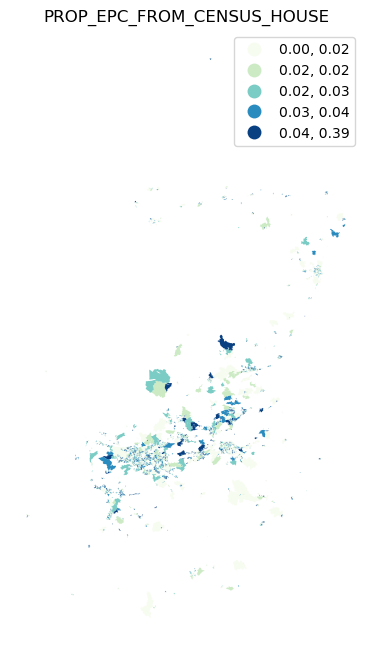

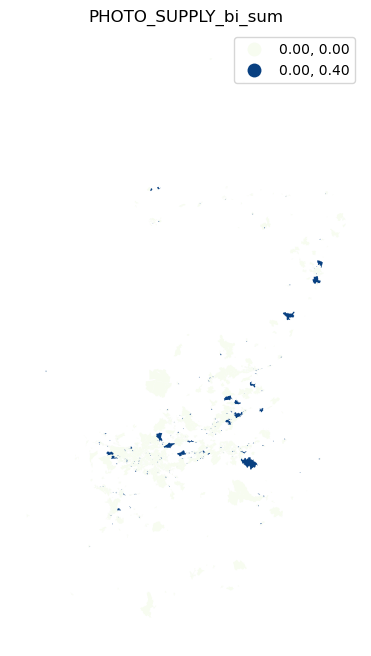

In [49]:
for i in cols_plot:
    ax = data.plot(column = i, legend = True, 
                                            cmap='GnBu',
                                            scheme="quantiles", k=5,
                                            figsize=(6, 8))
    ax.set_axis_off()
    plt.title(i)
    plt.savefig(str('./../../Volumes/Extreme_SSD/WORK/EPC/scottish_EPC/scottish_figures/gas_only/' + i +'.png'))

In [50]:
df = data.loc[:,cols_plot]
corr = df.corr()
corr.style.background_gradient(cmap='coolwarm', axis=None).to_excel('./../../Volumes/Extreme_SSD/WORK/EPC/scottish_EPC/scottish_figures/gas_only_corrs.xlsx')